In [2]:
#!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate
!pip install -qq diffusers==0.31
!pip install transformers==4.28
!pip install accelerate==0.20.3

In [2]:
!pip list | grep transformers

transformers                  4.28.0


In [3]:
!pip list | grep accelerate

accelerate                    0.20.3


In [4]:
!pip install -qq diffusers==0.31

In [5]:
!pip list | grep cudatoolkit

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so
/opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so: undefined symbol: cadam32bit_grad_fp32
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching in backup paths...
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 113
CUDA SETUP: Loading binary /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so...


/opt/conda/lib/python3.9/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/usr/local/nvidia/lib')}
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /usr/local/nvidia/lib:/usr/local/nvidia/lib64 did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('tcp'), Posix

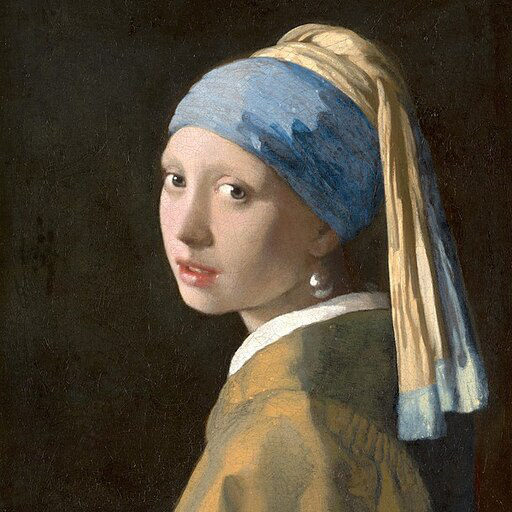

In [6]:
import torch
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image 

# 이미지 불러오기
image = load_image(
    "https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png"
)

image

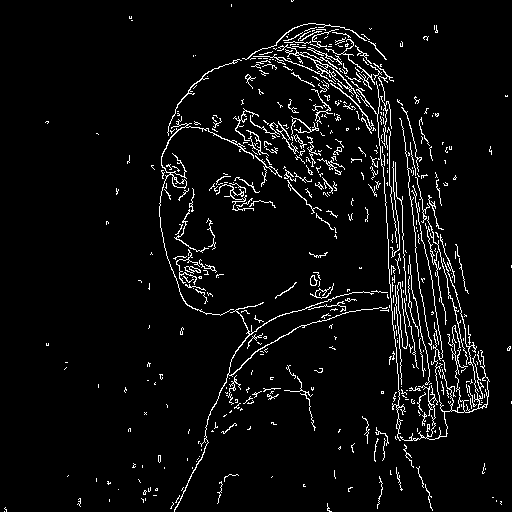

In [7]:
import cv2
from PIL import Image 
import numpy as np

# 이미지를 NumPy 배열로 변환합니다. 
image = np.array(image)

# threshold를 지정합니다. 
low_threshold = 100
high_threshold = 200

# 윤곽선을 검출합니다. 
image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다. 

canny_image

In [8]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

canny_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
canny_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=canny_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/20 [00:00<?, ?it/s]

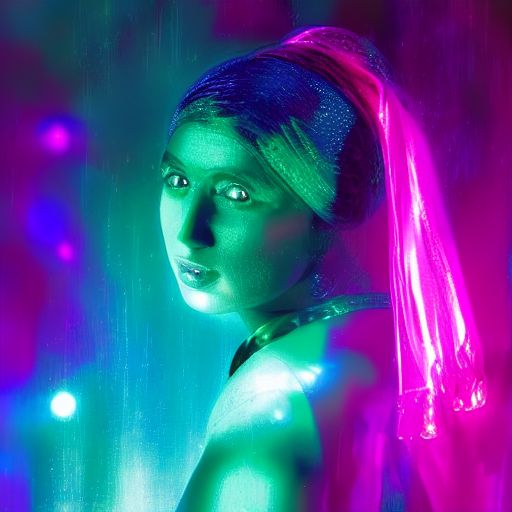

In [9]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="disco dancer with colorful lights", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

  0%|          | 0/20 [00:00<?, ?it/s]

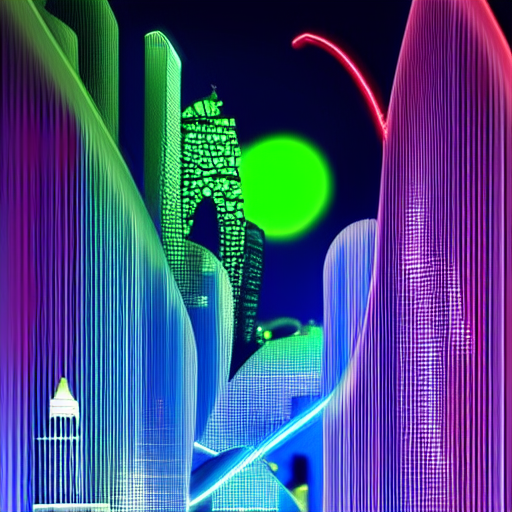

In [10]:
from diffusers import UniPCMultistepScheduler

# 스케줄러 설정
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(0)

# 새로운 프롬프트로 이미지를 생성합니다.
canny_image = canny_pipe(
    prompt="futuristic cityscape with neon lights",  # 프롬프트 변경
    num_inference_steps=20,
    generator=generator,
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다.
canny_image.save("/aiffel/aiffel/canny_image.png")

# 생성된 이미지를 출력합니다.
canny_image


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


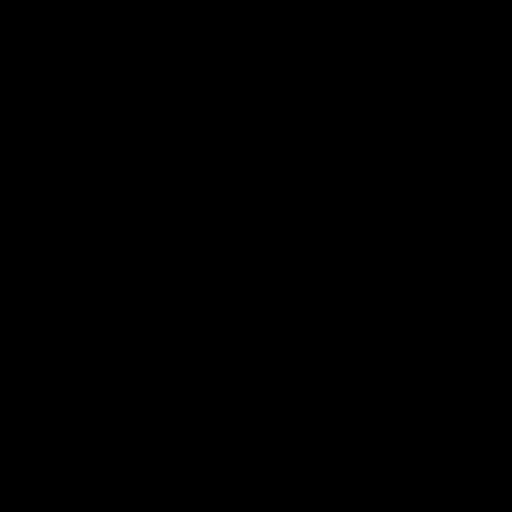

In [11]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="mermaid", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

  0%|          | 0/10 [00:00<?, ?it/s]

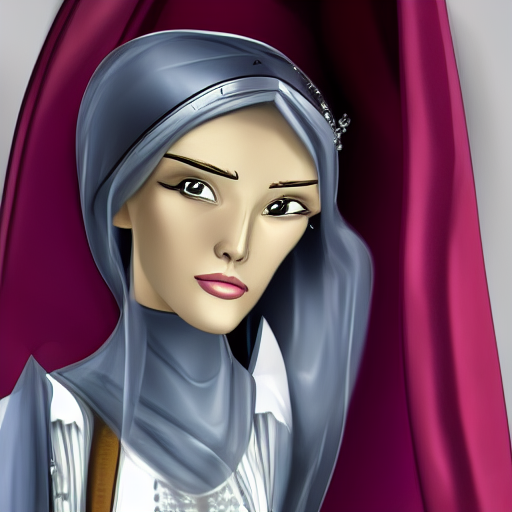

In [12]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="medieval princess, in a modern fashion, maintaining the original scene's essence", 
    num_inference_steps=10, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

  0%|          | 0/20 [00:00<?, ?it/s]

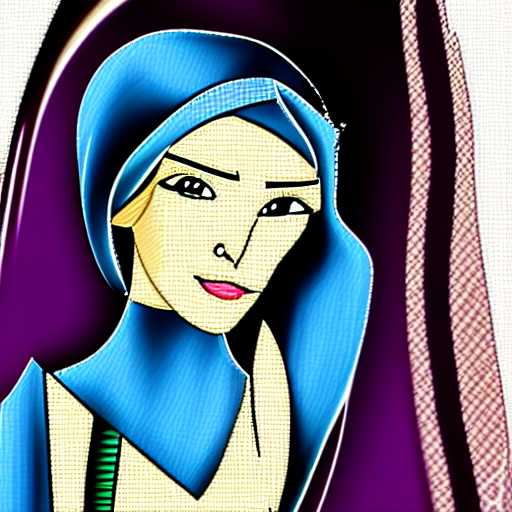

In [13]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="medieval princess, in a modern fashion, maintaining the original scene's essence", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image,
    strength=0.3
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

In [14]:
torch.cuda.empty_cache()

  0%|          | 0/20 [00:00<?, ?it/s]

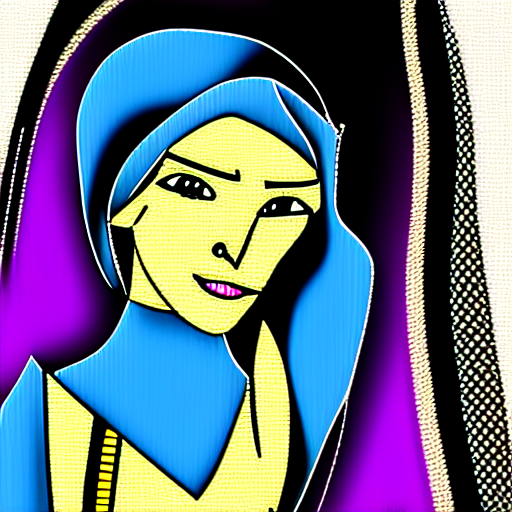

In [16]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="cartoonish", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

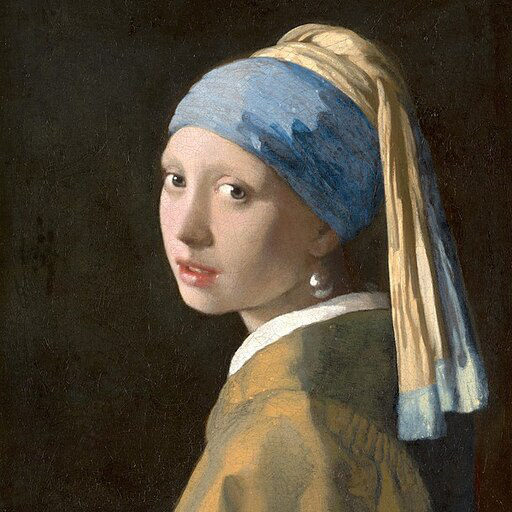

In [17]:
# 이미지 불러오기
image = load_image(
    "https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png"
)

image

  0%|          | 0/20 [00:00<?, ?it/s]

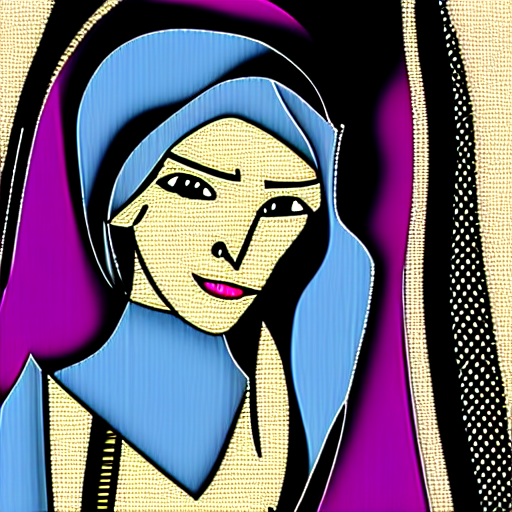

In [18]:
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다. 
generator = torch.manual_seed(0)  

# 이미지를 생성합니다. 
canny_image = canny_pipe(
    prompt="medieval princess, in a modern fashion, maintaining the original scene's essence", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]

# 생성된 이미지를 저장합니다. 
canny_image.save("/aiffel/aiffel/canny_image.png")  

# 생성된 이미지를 출력합니다. 
canny_image

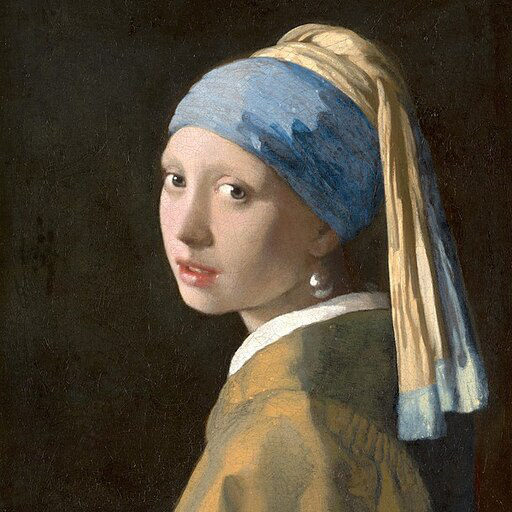

In [19]:
# 이미지 불러오기
image = load_image(
    "https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png"
)

image

In [20]:
canny_image = canny_pipe(
    prompt="disco dancer without a hat, in colorful lights", 
    num_inference_steps=20, 
    generator=generator, 
    image=canny_image
).images[0]


  0%|          | 0/20 [00:00<?, ?it/s]

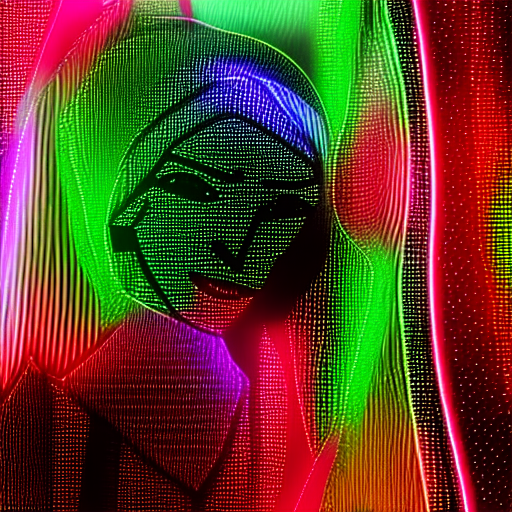

In [21]:
canny_image

무섭다..

In [6]:
# controlnet-aux를 설치합니다. Human pose를 검출해주는 controlnet의 보조용 모델입니다.
!pip install controlnet-aux==0.0.1

     |████████████████████████████████| 64 kB 3.2 MB/s             


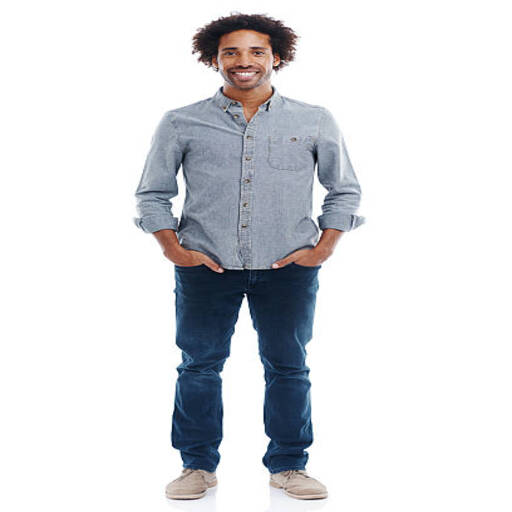

In [23]:
from diffusers.utils import load_image

openpose_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/person.png"
)
openpose_image

body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

cuda


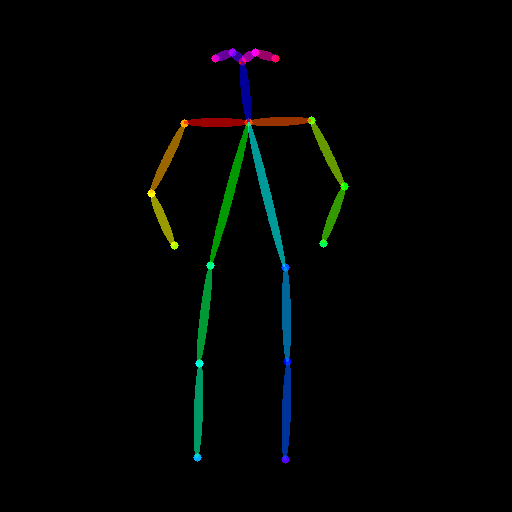

In [24]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(openpose_image)
openpose_image

In [25]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel 

openpose_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)
openpose_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=openpose_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/20 [00:00<?, ?it/s]

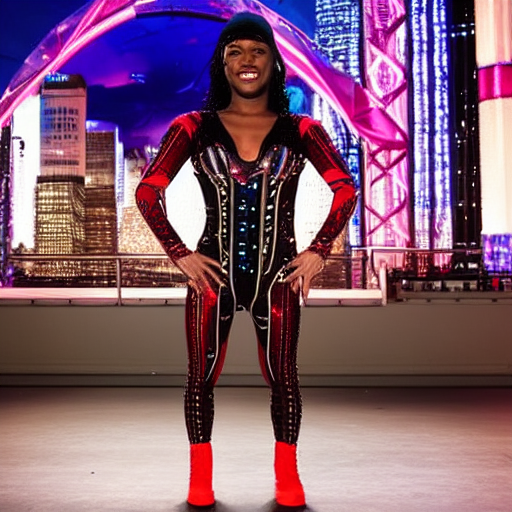

In [26]:
from diffusers import UniPCMultistepScheduler
import torch

# 스케줄러 설정
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(42)  # 시드를 설정하여 결과를 재현 가능하게 만듭니다.

# 프롬프트와 부정적인 프롬프트 작성
prompt = "a dancer performing a lively routine in a futuristic cityscape, vibrant lights around"
negative_prompt = "no dark colors, no blurred motion, no messy background"

# 이미지 생성
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=openpose_image  # 여기에 기존 이미지나 생성된 이미지를 넣을 수 있습니다.
).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1


  0%|          | 0/20 [00:00<?, ?it/s]

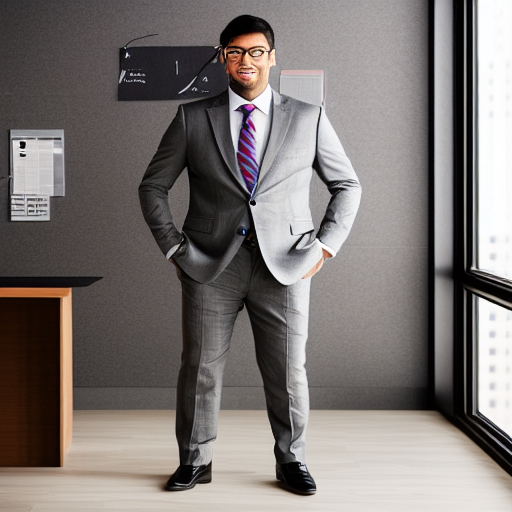

In [27]:
from diffusers import UniPCMultistepScheduler
import torch

# 스케줄러 설정
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(42)  # 시드를 설정하여 결과를 재현 가능하게 만듭니다.

# 프롬프트와 부정적인 프롬프트 작성
prompt = "a well-proportioned office worker in a suit"
negative_prompt = "no hair, no "

# 이미지 생성
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=openpose_image  # 여기에 기존 이미지나 생성된 이미지를 넣을 수 있습니다.
).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1


  0%|          | 0/20 [00:00<?, ?it/s]

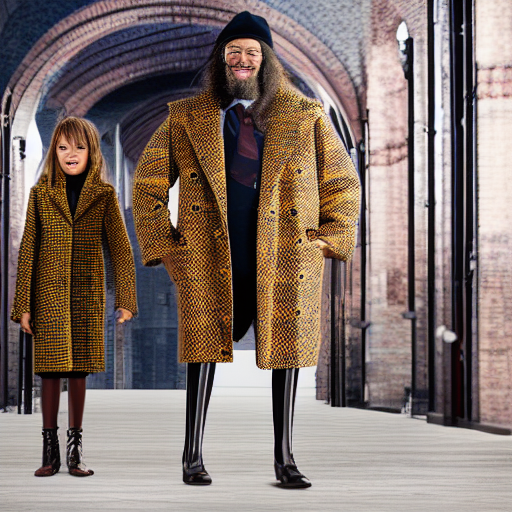

In [28]:
from diffusers import UniPCMultistepScheduler
import torch

# 스케줄러 설정
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(42)  # 시드를 설정하여 결과를 재현 가능하게 만듭니다.

# 프롬프트와 부정적인 프롬프트 작성
prompt = "3 tall people with long legs"
negative_prompt = "no hair "

# 이미지 생성
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=openpose_image  # 여기에 기존 이미지나 생성된 이미지를 넣을 수 있습니다.
).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1


  0%|          | 0/20 [00:00<?, ?it/s]

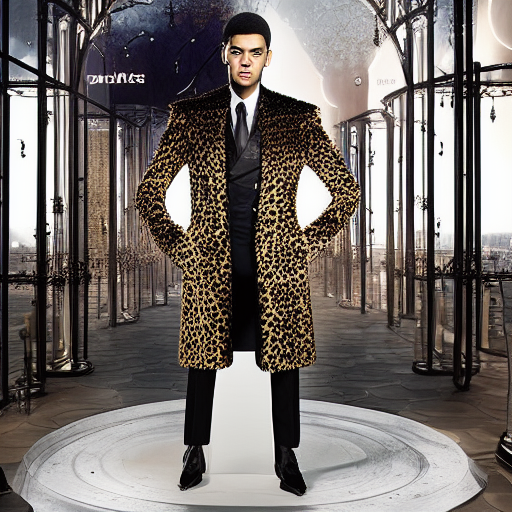

In [29]:
# 스케줄러 설정
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(42)  # 시드를 설정하여 결과를 재현 가능하게 만듭니다.

# 프롬프트와 부정적인 프롬프트 작성
prompt = "a group of three tall individuals with striking features, wearing elegant outfits, standing in a futuristic cityscape."
negative_prompt = "no short figures, no disheveled clothes, no blurred or incomplete faces."

# 이미지 생성
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=openpose_image  # 여기에 기존 이미지나 생성된 이미지를 넣을 수 있습니다.
).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1

  0%|          | 0/20 [00:00<?, ?it/s]

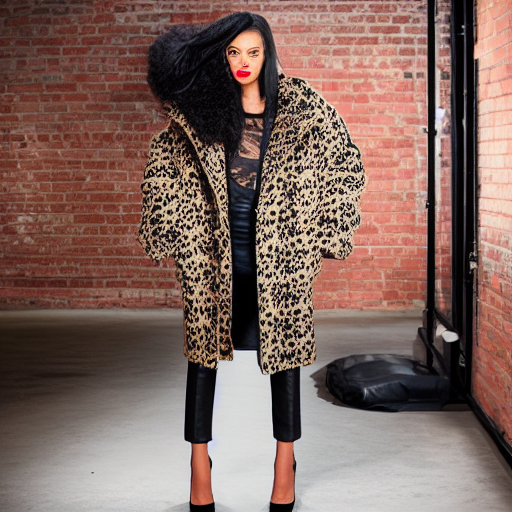

In [30]:
# 스케줄러 설정
openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(42)  # 시드를 설정하여 결과를 재현 가능하게 만듭니다.

# 프롬프트와 부정적인 프롬프트 작성
prompt = "a female fashion model"
negative_prompt = "no short figures, no disheveled clothes, no blurred or incomplete faces."

# 이미지 생성
openpose_image1 = openpose_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=20,
    generator=generator,
    image=openpose_image  # 여기에 기존 이미지나 생성된 이미지를 넣을 수 있습니다.
).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1

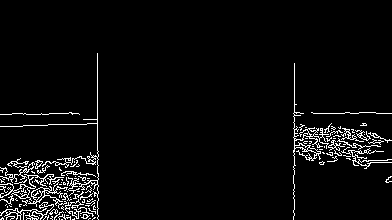

In [4]:
from diffusers.utils import load_image
from PIL import Image
import cv2
import numpy as np

# 이미지를 URL에서 불러옵니다.
canny_image = load_image("https://ifh.cc/g/Q18b7Y.jpg")  

# 이미지를 흑백으로 변환합니다.
canny_image = canny_image.convert("L")

# threshold를 지정합니다. 
low_threshold = 50
high_threshold = 150

# 이미지를 NumPy 배열로 변환합니다.
canny_image = np.array(canny_image)

# 인체 감지 포즈를 넣어줄 가운데 부분을 지워줍니다.
zero_start = canny_image.shape[1] // 4
zero_end = zero_start + canny_image.shape[1] // 2
canny_image[:, zero_start:zero_end] = 0

# 윤곽선을 검출합니다. 
canny_image = cv2.Canny(canny_image, low_threshold, high_threshold)

# NumPy 배열을 PIL 이미지로 변환합니다. 
canny_image = Image.fromarray(canny_image)

# 이미지를 출력합니다. 
canny_image.show()


body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

cuda


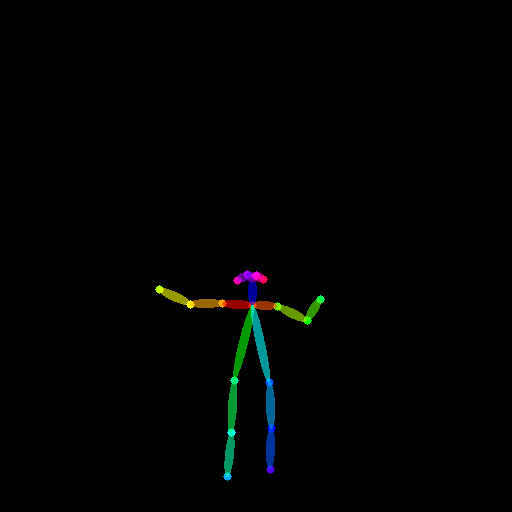

In [7]:
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image
from PIL import Image

# 이미지를 불러옵니다.
image_path = "https://ifh.cc/g/j2MFzx.jpg"  # URL 또는 로컬 경로를 사용할 수 있음
openpose_image = load_image(image_path)

# OpenposeDetector를 초기화합니다.
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 인체 자세를 검출합니다.
detected_pose = openpose(openpose_image)

# `detected_pose`가 PIL.Image 객체로 반환되므로 바로 사용할 수 있습니다.
detected_pose.show()  # 검출된 인체 자세 이미지를 출력합니다.



===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so
/opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so: undefined symbol: cadam32bit_grad_fp32
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching in backup paths...
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 113
CUDA SETUP: Loading binary /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so...


/opt/conda/lib/python3.9/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/usr/local/nvidia/lib')}
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /usr/local/nvidia/lib:/usr/local/nvidia/lib64 did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('tcp'), Posix

cuda


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

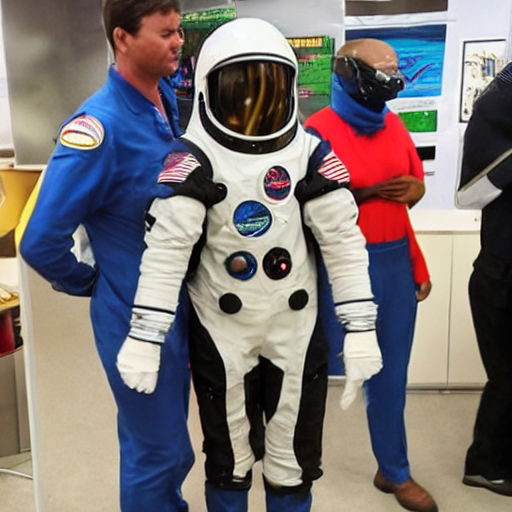

In [4]:
from diffusers import StableDiffusionPipeline
import torch
from PIL import Image
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

# 이미지 불러오기
image_path = "https://ifh.cc/g/j2MFzx.jpg"
openpose_image = load_image(image_path)

# OpenposeDetector를 초기화하고, 인체 자세를 검출합니다.
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
detected_pose = openpose(openpose_image)

# Stable Diffusion 모델을 GPU 메모리에 맞춰 로드합니다.
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", 
                                              torch_dtype=torch.float16).to("cuda")

# 프롬프트를 설정합니다.
prompt = "A man is wearing a spacesuit."

# 이미지를 생성합니다. 
with torch.no_grad():
    generated_image = pipe(prompt=prompt, 
                           init_image=detected_pose, 
                           strength=0.75, 
                           num_inference_steps=50).images[0]

# 생성된 이미지를 출력합니다.
generated_image.show()


In [ ]:
from diffusers import StableDiffusionPipeline
import torch
from PIL import Image

# 사용자로부터 프롬프트를 입력받습니다.
prompt = input("생성할 이미지에 대한 프롬프트를 입력하세요: ")

# Stable Diffusion 모델을 GPU 메모리에 맞춰 로드합니다.
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", 
                                              torch_dtype=torch.float16).to("cuda")

# 배경 이미지와 인체 포즈 이미지를 사용하여 이미지 생성
with torch.no_grad():
    generated_image = pipe(prompt=prompt, 
                           init_image=canny_image,  # 배경 이미지
                           strength=0.75,  # 배경과 포즈 결합 강도
                           num_inference_steps=50,  # 생성 단계
                           controlnet_conditioning_image=detected_pose).images[0]

# 생성된 이미지를 출력합니다.
generated_image.show()


In [55]:
torch.cuda.empty_cache()

생성할 이미지에 대한 프롬프트를 입력하세요: Amusement park mascot. Yellow bear character


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

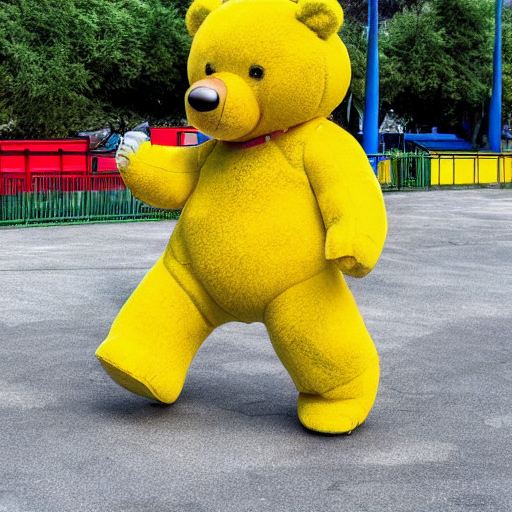

In [8]:
from diffusers import StableDiffusionPipeline
import torch
from PIL import Image

# 사용자로부터 프롬프트를 입력받습니다.
prompt = input("생성할 이미지에 대한 프롬프트를 입력하세요: ")

# Stable Diffusion 모델을 GPU 메모리에 맞춰 로드합니다.
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", 
                                              torch_dtype=torch.float16).to("cuda")

# 배경 이미지와 인체 포즈 이미지를 사용하여 이미지 생성
with torch.no_grad():
    generated_image = pipe(prompt=prompt, 
                           init_image=canny_image,  # 배경 이미지
                           strength=0.75,  # 배경과 포즈 결합 강도
                           num_inference_steps=50,  # 생성 단계
                           controlnet_conditioning_image=detected_pose).images[0]

# 생성된 이미지를 출력합니다.
generated_image.show()
